In [701]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import os
import scipy.cluster.hierarchy as shc
import matplotlib.patches as patches
from matplotlib.patches import Rectangle
from math import isnan
from random import sample
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
import yellowbrick
from numpy.random import uniform
from sklearn.neighbors import NearestNeighbors
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import davies_bouldin_score, silhouette_score, calinski_harabasz_score
from sklearn.preprocessing import OneHotEncoder
from yellowbrick.style import set_palette
from yellowbrick.contrib.wrapper import wrap


# --- Libraries Settings ---
warnings.filterwarnings('ignore')
sns.set_style('whitegrid')
plt.rcParams['figure.dpi'] = 600
sns.set_theme(rc = {'axes.facecolor': '#FBFBFB', 'figure.facecolor': '#FBFBFB'})
class clr:
    start = '\033[93m'+'\033[1m'
    color = '\033[93m'
    end = '\033[0m'
df=pd.read_csv("C:\\Users\\Garimidi Siva Sree\\TunisiaLocalChapter_UEFAEURO2024\\task2-data-analysis\\newmatchlineups.csv")
df.head()

,Unnamed: 0,country,officialname,officialsurname,shortname,jerseynumber,isgoalkeeper,jerseyname,iscaptain,numorder,tacticx,tacticy
0,0,Austria,Daniel,Bachmann,Bachmann,13.0,True,Bachmann,False,1.0,150.0,504.0
1,1,Austria,Andreas,Ulmer,Ulmer,2.0,False,Ulmer,False,2.0,562.0,153.0
2,2,Austria,Aleksandar,Dragovic,Dragovic,3.0,False,Dragovic,False,3.0,345.0,737.0
3,3,Austria,Martin,Hinteregger,Hinteregger,4.0,False,Hinteregger,False,4.0,370.0,317.0
4,4,Austria,David,Alaba,Alaba,8.0,False,Alaba,True,5.0,328.0,455.0


In [702]:
## Initialize OneHotEncoder
onehot_encoder = OneHotEncoder(sparse_output=False, drop='first')

# Apply OneHotEncoder on categorical columns ('country')
encoded_columns = onehot_encoder.fit_transform(df[['country','numorder','isgoalkeeper','iscaptain']])

# Convert encoded columns to DataFrame and concatenate with original data
encoded_data= pd.DataFrame(encoded_columns, columns=onehot_encoder.get_feature_names_out(['country','numorder','isgoalkeeper','iscaptain']))
df_encoded_onehot = pd.concat([df.drop(['country','numorder','isgoalkeeper','iscaptain'], axis=1), encoded_data], axis=1)
new_df=df_encoded_onehot.copy()

# Inverse transform example (for LabelEncoder)
#inverse_transformed = label_encoder.inverse_transform(df_encoded_label['numorder'])
#print("\nInverse Transformed Labels:")
#print(inverse_transformed)
new_df.shape
new_df.columns



Index(['Unnamed: 0', 'officialname', 'officialsurname', 'shortname',
       'jerseynumber', 'jerseyname', 'tacticx', 'tacticy', 'country_Austria',
       'country_Belgium', 'country_Croatia', 'country_Czech Republic',
       'country_Denmark', 'country_England', 'country_Finland',
       'country_France', 'country_Germany', 'country_Hungary', 'country_Italy',
       'country_Lithuania', 'country_Netherlands', 'country_North Macedonia',
       'country_Poland', 'country_Portugal', 'country_Republic of Ireland',
       'country_Russia', 'country_Scotland', 'country_Slovakia',
       'country_Spain', 'country_Sweden', 'country_Switzerland',
       'country_Turkey', 'country_USA', 'country_Ukraine', 'country_Wales',
       'numorder_2.0', 'numorder_3.0', 'numorder_4.0', 'numorder_5.0',
       'numorder_6.0', 'numorder_7.0', 'numorder_8.0', 'numorder_9.0',
       'numorder_10.0', 'numorder_11.0', 'numorder_12.0', 'numorder_13.0',
       'numorder_14.0', 'numorder_15.0', 'numorder_16.0', 'nu

In [703]:

new_df.drop(columns=['tacticx', 'tacticy'], inplace=True)
new_df.columns
new_df.shape

(3364, 57)

In [704]:
new_df

,Unnamed: 0,officialname,officialsurname,shortname,jerseynumber,jerseyname,country_Austria,country_Belgium,country_Croatia,country_Czech Republic,...,numorder_16.0,numorder_17.0,numorder_18.0,numorder_19.0,numorder_20.0,numorder_21.0,numorder_22.0,numorder_23.0,isgoalkeeper_True,iscaptain_True
0,0,Daniel,Bachmann,Bachmann,13.0,Bachmann,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,1,Andreas,Ulmer,Ulmer,2.0,Ulmer,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,Aleksandar,Dragovic,Dragovic,3.0,Dragovic,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3,Martin,Hinteregger,Hinteregger,4.0,Hinteregger,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,4,David,Alaba,Alaba,8.0,Alaba,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3359,3359,Tomáš,Jensen,James,1.0,Jensen,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3360,3360,Stephan,Meyer,James,1.0,Jensen,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3361,3361,Tomáš,Jensen,James,1.0,Jensen,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3362,3362,Nicolas,Mathieu,James,1.0,Jensen,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


The next step is to perform a statistical test using the Hopkins statistical test for the preprocessed dataset to measure the clustering tendency of data (measure to what degree clusters exist in the data to be clustered).

The following is the hypothesis of the Hopkins statistical test.
H0: The dataset is not uniformly distributed (contains meaningful clusters).
H1: The dataset is uniformly distributed (no meaningful clusters).
Criteria:
If the value is between {0.7, ..., 0.99}, accept H0 (it has a high tendency to cluster).

In [705]:

df = StandardScaler().fit_transform(df[['tacticx', 'tacticy']])
df.shape

scaled_df = pd.DataFrame(df, columns=['tacticx', 'tacticy'])


# Concatenate df_encoded_label and scaled_df
combined_df = pd.concat([new_df, scaled_df], axis=1)


# Drop unnecessary columns
combined_df.drop(columns=['Unnamed: 0', 'officialname', 'officialsurname', 'shortname', 'jerseynumber', 'jerseyname'], inplace=True)

combined_df.columns
# --- Hopkins Test (codes by Matevž Kunaver) ---
def hopkins(combined_df):
    d = combined_df.shape[1]
    n = len(combined_df)
    m = int(0.1 * n)
    nbrs = NearestNeighbors(n_neighbors=1).fit(combined_df)
 
    rand_X = sample(range(0, n, 1), m)
 
    ujd = []
    wjd = []
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(uniform(np.amin(combined_df,axis=0),np.amax(combined_df,axis=0),d).reshape(1, -1), 2, return_distance=True)
        ujd.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(combined_df.iloc[rand_X[j]].values.reshape(1, -1), 2, return_distance=True)
        wjd.append(w_dist[0][1])
 
    H = sum(ujd) / (sum(ujd) + sum(wjd))
    if isnan(H):
        print (ujd, wjd)
        H = 0
 
    return H

# --- Perform Hopkins Test ---
hopkins_value = hopkins(combined_df)
hopkins_result = 'Result: '+clr.start+'{:.4f}'.format(hopkins_value)+clr.end
print(clr.start+'.: Hopkins Test :.'+clr.end)
print(clr.color+'*' * 19+clr.end)
print(hopkins_result)
if  0.7 < hopkins_value < 0.99:
    print('>> From the result above,'+clr.color+' it has a high tendency to cluster (contains meaningful clusters)'+clr.end)
    print('\n'+clr.color+'*' * 31+clr.end)
    print(clr.start+'.:. Conclusions: Accept H0 .:.'+clr.end)
    print(clr.color+'*' * 31+clr.end)
else:
    print('>> From the result above,'+clr.color+' it has no meaningful clusters'+clr.end)
    print('\n'+clr.color+'*' * 31+clr.end)
    print(clr.start+'.:. Conclusions: Reject H0 .:.'+clr.end)
    print(clr.color+'*' * 31+clr.end)



.: Hopkins Test :.
*******************
Result: 0.9114
>> From the result above, it has a high tendency to cluster (contains meaningful clusters)

*******************************
.:. Conclusions: Accept H0 .:.
*******************************


In [706]:
X = np.asarray(combined_df)

# --- Applying PCA ---
pca = PCA(n_components=2, random_state=24)
X = pca.fit_transform(X)

Below we implement K-Means, DBSCAN and Agglomerative clustreing techiques. And evaluate which performs better.

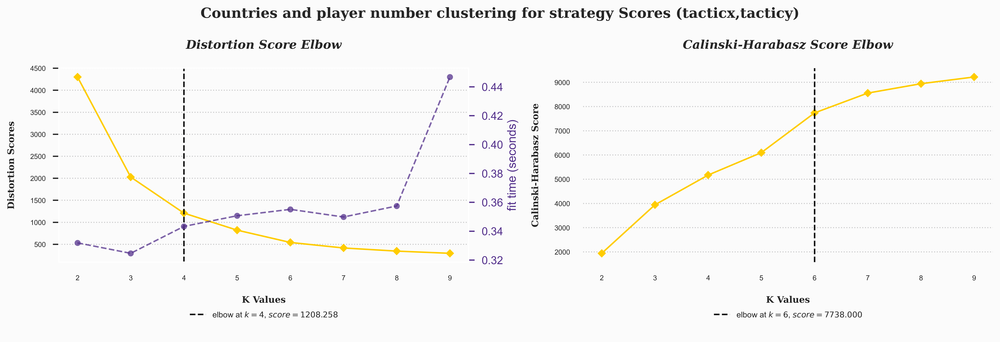

In [707]:
# --- Define K-Means Functions ---
def kmeans():
    
    # --- Figures Settings ---
    color_palette=['#FFCC00', '#54318C']
    set_palette(color_palette)
    title=dict(fontsize=12, fontweight='bold', style='italic', fontfamily='serif')
    text_style=dict(fontweight='bold', fontfamily='serif')
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    
    # --- Elbow Score ---
    elbow_score = KElbowVisualizer(KMeans(random_state=32, max_iter=500), k=(2, 10), ax=ax1)
    elbow_score.fit(X)
    elbow_score.finalize()
    elbow_score.ax.set_title('Distortion Score Elbow\n', **title)
    elbow_score.ax.tick_params(labelsize=7)
    for text in elbow_score.ax.legend_.texts:
        text.set_fontsize(9)
    for spine in elbow_score.ax.spines.values():
        spine.set_color('None')
    elbow_score.ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), borderpad=2, frameon=False, fontsize=8)
    elbow_score.ax.grid(axis='y', alpha=0.5, color='#9B9A9C', linestyle='dotted')
    elbow_score.ax.grid(axis='x', alpha=0)
    elbow_score.ax.set_xlabel('\nK Values', fontsize=9, **text_style)
    elbow_score.ax.set_ylabel('Distortion Scores\n', fontsize=9, **text_style)
    
    # --- Elbow Score (Calinski-Harabasz Index) ---
    elbow_score_ch = KElbowVisualizer(KMeans(random_state=32, max_iter=500), k=(2, 10), metric='calinski_harabasz', timings=False, ax=ax2)
    elbow_score_ch.fit(X)
    elbow_score_ch.finalize()
    elbow_score_ch.ax.set_title('Calinski-Harabasz Score Elbow\n', **title)
    elbow_score_ch.ax.tick_params(labelsize=7)
    for text in elbow_score_ch.ax.legend_.texts:
        text.set_fontsize(9)
        for spine in elbow_score_ch.ax.spines.values():
            spine.set_color('None')
    elbow_score_ch.ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), borderpad=2, frameon=False, fontsize=8)
    elbow_score_ch.ax.grid(axis='y', alpha=0.5, color='#9B9A9C', linestyle='dotted')
    elbow_score_ch.ax.grid(axis='x', alpha=0)
    elbow_score_ch.ax.set_xlabel('\nK Values', fontsize=9, **text_style)
    elbow_score_ch.ax.set_ylabel('Calinski-Harabasz Score\n', fontsize=9, **text_style)
    
    plt.suptitle('Countries and player number clustering for strategy Scores (tacticx,tacticy)', fontsize=14, **text_style)
    plt.tight_layout()
    plt.show();

# --- Calling K-Means Functions ---
kmeans();

Based on the results of the elbow method and Calinski Harabasz score above, it can be concluded that the best clustering number for the K-Means algorithm is 4 clusters. The following steps will apply the number of optimal clusters, visualize clusters distribution plot, and silhouette plots to evaluate their performance.

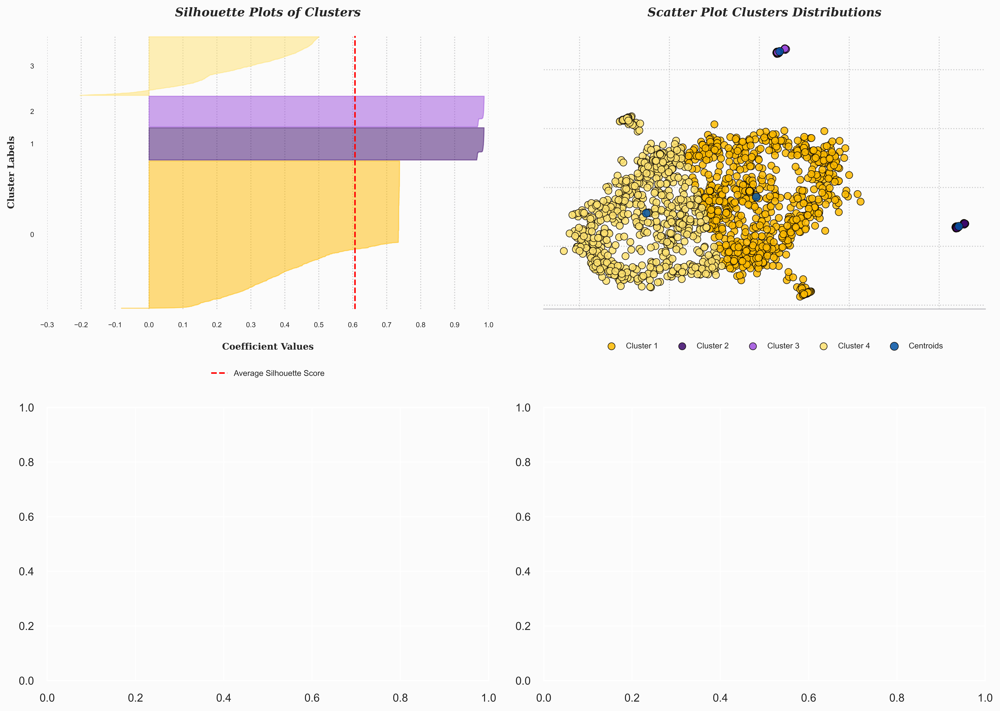

In [708]:


# --- Implementing K-Means ---
kmeans = KMeans(n_clusters=4, random_state=32, max_iter=500)
y_kmeans = kmeans.fit_predict(X)

# --- Define K-Means Visualizer & Plots ---
def visualizer(kmeans, y_kmeans):
    
    # --- Figures Settings ---
    cluster_colors = ['#FFBB00', '#3C096C', '#9D4EDD', '#FFE270']
    labels = ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4', 'Centroids']
    title = dict(fontsize=12, fontweight='bold', style='italic', fontfamily='serif')
    text_style = dict(fontweight='bold', fontfamily='serif')
    scatter_style = dict(linewidth=0.65, edgecolor='#100C07', alpha=0.85)
    legend_style = dict(borderpad=2, frameon=False, fontsize=8)
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(14, 10))
    
    # --- Silhouette Plots ---
    s_viz = SilhouetteVisualizer(kmeans, ax=ax1, colors=cluster_colors)
    s_viz.fit(X)
    s_viz.finalize()
    s_viz.ax.set_title('Silhouette Plots of Clusters\n', **title)
    s_viz.ax.tick_params(labelsize=7)
    for text in s_viz.ax.legend_.texts:
        text.set_fontsize(9)
    for spine in s_viz.ax.spines.values():
        spine.set_color('None')
    s_viz.ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), **legend_style)
    s_viz.ax.grid(axis='x', alpha=0.5, color='#9B9A9C', linestyle='dotted')
    s_viz.ax.grid(axis='y', alpha=0)
    s_viz.ax.set_xlabel('\nCoefficient Values', fontsize=9, **text_style)
    s_viz.ax.set_ylabel('Cluster Labels\n', fontsize=9, **text_style)
        
    # --- Clusters Distribution ---
    y_kmeans_labels = list(set(y_kmeans.tolist()))
    for i in y_kmeans_labels:
        ax2.scatter(X[y_kmeans==i, 0], X[y_kmeans==i, 1], s=50, c=cluster_colors[i], **scatter_style)
    ax2.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=65, c='#0353A4', label='Centroids', **scatter_style)
    for spine in ax2.spines.values():
        spine.set_color('None')  # Uncomment this line to remove spine colors
    ax2.set_title('Scatter Plot Clusters Distributions\n', **title)
    ax2.legend(labels, bbox_to_anchor=(0.95, -0.05), ncol=5, **legend_style)
    ax2.grid(axis='both', alpha=0.5, color='#9B9A9C', linestyle='dotted')
    ax2.tick_params(left=False, right=False, labelleft=False, labelbottom=False, bottom=False)
    ax2.spines['bottom'].set_visible(True)
    ax2.spines['bottom'].set_color('#CAC9CD')

    # Show the plot
    plt.tight_layout()
    plt.show()

# Call the visualizer function
visualizer(kmeans, y_kmeans)

    
      

In [709]:
def evaluate_clustering(X, y):
    db_index = round(davies_bouldin_score(X, y), 3)
    s_score = round(silhouette_score(X, y), 3)
    ch_index = round(calinski_harabasz_score(X, y), 3)
    print(clr.start+'.: Evaluate Clustering Quality :.'+clr.end)
    print(clr.color+'*' * 34+clr.end)
    print('Davies-Bouldin Index: '+clr.start, db_index)
    print(clr.end+'Silhouette Score: '+clr.start, s_score)
    print(clr.end+'Calinski Harabasz Index: '+clr.start, ch_index)
    return db_index, s_score, ch_index

# --- Evaluate K-Means Cluster Quality ---
db_kmeans, ss_kmeans, ch_kmeans = evaluate_clustering(X, y_kmeans)

.: Evaluate Clustering Quality :.
**********************************
Davies-Bouldin Index:  0.611
Silhouette Score:  0.606
Calinski Harabasz Index:  5172.509


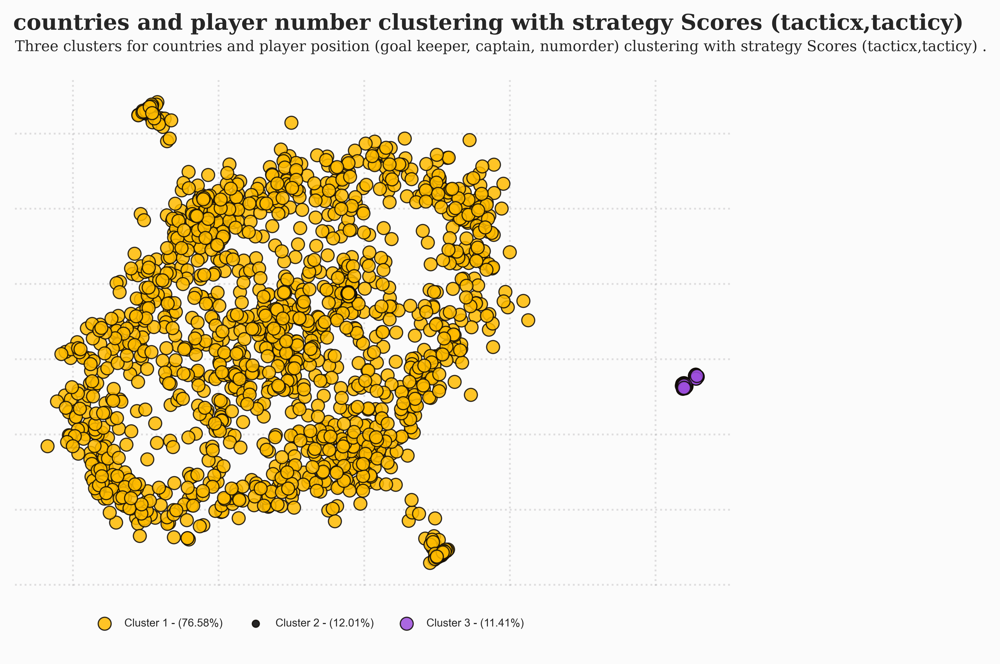

In [710]:
# --- Implementing DBSCAN ---
dbscan = DBSCAN(eps=1, min_samples=4)
y_dbscan = dbscan.fit_predict(X)
    
# --- Define DBSCAN Result Distribution ---
def dbscan_visualizer(dbscan, y_dbscan):
    
    # --- Figures Settings ---
    cluster_colors=['#FFBB00', '#9D4EDD', 'black']
    labels = ['Cluster 1', 'Cluster 2', 'Outliers']
    suptitle=dict(fontsize=12, fontweight='heavy', fontfamily='serif')
    title=dict(fontsize=8, fontfamily='serif')
    scatter_style=dict(linewidth=0.65, edgecolor='#100C07', alpha=0.85)
    bbox=dict(boxstyle='round', pad=0.3, color='#FFDA47', alpha=0.6)
    txt=dict(textcoords='offset points', va='center', ha='center', fontfamily='serif', style='italic')
    legend_style=dict(borderpad=2, frameon=False, fontsize=6)
      # --- Arrow Settings ---
    style = 'Simple, tail_width=0.3, head_width=3, head_length=5'
    kw = dict(arrowstyle=style, color='#3E3B39')
    arrow1 = patches.FancyArrowPatch((23, 18), (24.1, 9.3), connectionstyle='arc3, rad=-0.16', **kw)
    arrow2 = patches.FancyArrowPatch((23.3, 18), (29.5, 9.3), connectionstyle='arc3, rad=-0.16', **kw)
    
    # --- Percentage labels ---
    unique, counts = np.unique(y_dbscan, return_counts=True)
    dbscan_count = dict(zip(unique, counts))
    total = sum(dbscan_count.values())
    dbscan_label = {key: round(value/total*100, 2) for key, value in dbscan_count.items() if key != -1}

    # --- Clusters Distribution ---
    y_dbscan_labels = list(set(y_dbscan.tolist()))
    fig, ax = plt.subplots(1, 1, figsize=(7, 5))
    for i in np.arange(0, 2, 1):
        plt.scatter(X[y_dbscan==i, 0], X[y_dbscan == i, 1], s=50, c=cluster_colors[i], label=labels[i], **scatter_style)
        plt.scatter(X[y_dbscan==-1, 0], X[y_dbscan == -1, 1], s=15, c=cluster_colors[2], label=labels[2], **scatter_style)
    for spine in ax.spines.values():
        spine.set_color('None')
    plt.legend([f"Cluster {i+1} - ({k}%)" for i, k in dbscan_label.items()], bbox_to_anchor=(0.75, -0.01), ncol=3, **legend_style)
    plt.grid(axis='both', alpha=0.3, color='#9B9A9C', linestyle='dotted')
    plt.tick_params(left=False, right=False , labelleft=False , labelbottom=False, bottom=False)
    plt.title('Three clusters for countries and player position (goal keeper, captain, numorder) clustering with strategy Scores (tacticx,tacticy) .\n', loc='left', **title)
    plt.suptitle('countries and player number clustering with strategy Scores (tacticx,tacticy)', x=0.123, y=0.98, ha='left', **suptitle)
    plt.show();
    
# --- Calling DBSCAN Functions ---
dbscan_visualizer(dbscan, y_dbscan)

In [711]:
# --- Evaluate DBSCAN Cluster Quality ---
db_dbscan, ss_dbscan, ch_dbscan = evaluate_clustering(X, y_dbscan)

.: Evaluate Clustering Quality :.
**********************************
Davies-Bouldin Index:  0.299
Silhouette Score:  0.662
Calinski Harabasz Index:  3937.52


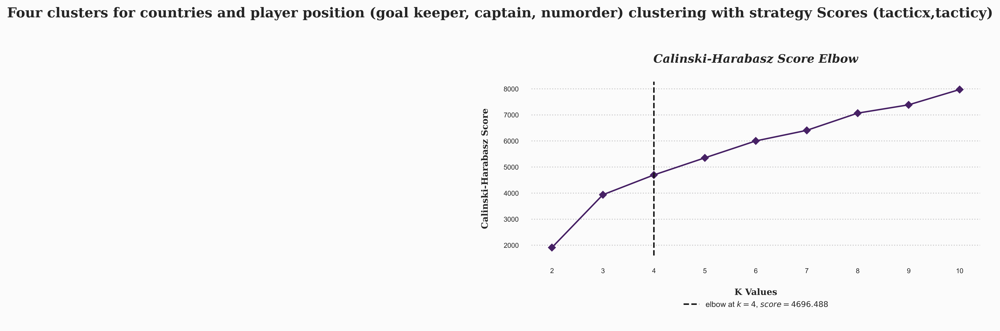

In [712]:
def agg_dendrogram():
    
    # --- Figure Settings ---
    color_palette=['#472165', '#FFBB00', '#3C096C', '#9D4EDD', '#FFE270']
    set_palette(color_palette)
    text_style=dict(fontweight='bold', fontfamily='serif')
    ann=dict(textcoords='offset points', va='center', ha='center', fontfamily='serif', style='italic')
    title=dict(fontsize=12, fontweight='bold', style='italic', fontfamily='serif')
    bbox=dict(boxstyle='round', pad=0.3, color='#FFDA47', alpha=0.6)
    fig=plt.figure(figsize=(14, 5))
#Elbow function
    ax2=fig.add_subplot(1, 2, 2)
    elbow_score_ch = KElbowVisualizer(AgglomerativeClustering(), metric='calinski_harabasz', timings=False, ax=ax2)
    elbow_score_ch.fit(X)
    elbow_score_ch.finalize()
    elbow_score_ch.ax.set_title('Calinski-Harabasz Score Elbow\n', **title)
    elbow_score_ch.ax.tick_params(labelsize=7)
    for text in elbow_score_ch.ax.legend_.texts:
        text.set_fontsize(9)
    for spine in elbow_score_ch.ax.spines.values():
        spine.set_color('None')
    elbow_score_ch.ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), borderpad=2, frameon=False, fontsize=8)
    elbow_score_ch.ax.grid(axis='y', alpha=0.5, color='#9B9A9C', linestyle='dotted')
    elbow_score_ch.ax.grid(axis='x', alpha=0)
    elbow_score_ch.ax.set_xlabel('\nK Values', fontsize=9, **text_style)
    elbow_score_ch.ax.set_ylabel('Calinski-Harabasz Score\n', fontsize=9, **text_style)
    plt.suptitle('Four clusters for countries and player position (goal keeper, captain, numorder) clustering with strategy Scores (tacticx,tacticy)\n', fontsize=14, **text_style)
    plt.tight_layout()
    plt.show();
agg_dendrogram();


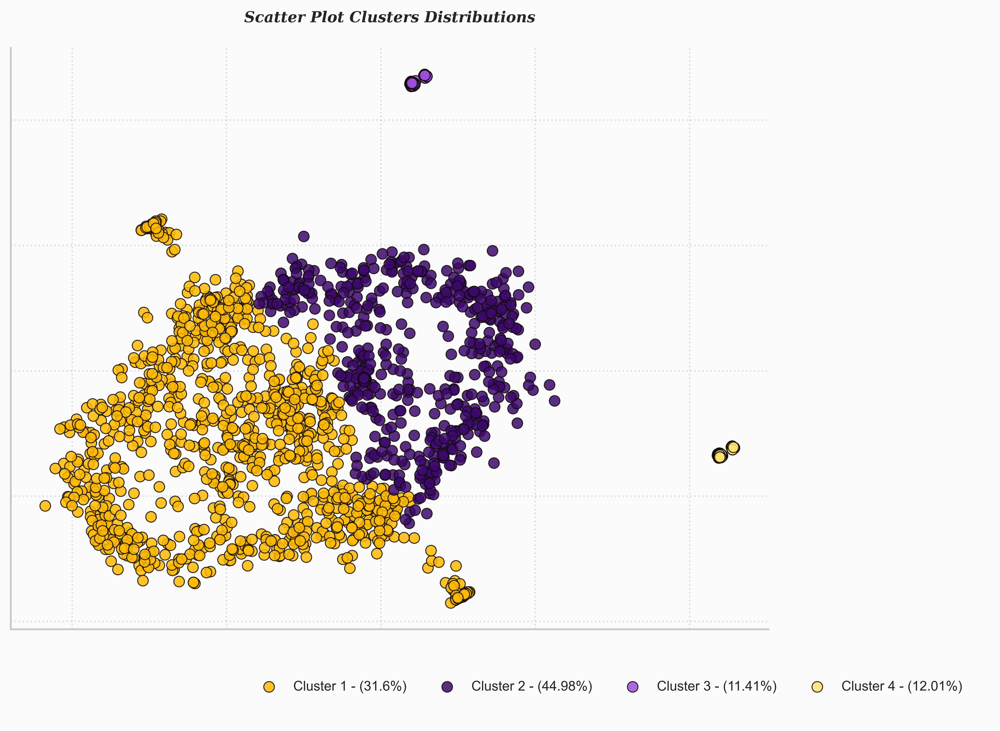

In [713]:
# --- Implementing Hierarchical Clustering ---
agg_cluster = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')
y_agg_cluster = agg_cluster.fit_predict(X)
    
# --- Define Hierarchical Clustering Distributions ---
def agg_visualizer(agg_cluster, y_agg_cluster):
    
    # --- Figures Settings ---
    cluster_colors=['#FFBB00', '#3C096C', '#9D4EDD', '#FFE270']
    labels = ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4']
    suptitle=dict(fontsize=14, fontweight='heavy', fontfamily='serif')
    title=dict(fontsize=10, fontweight='bold', style='italic', fontfamily='serif')
    scatter_style=dict(linewidth=0.65, edgecolor='#100C07', alpha=0.85)
    legend_style=dict(borderpad=2, frameon=False, fontsize=9)
    fig=plt.figure(figsize=(14, 7))
    # --- Percentage Labels ---
    unique, counts = np.unique(y_agg_cluster, return_counts=True)
    df_waffle = dict(zip(unique, counts))
    total = sum(df_waffle.values())
    wfl_square = {key: value/100 for key, value in df_waffle.items()}
    wfl_label = {key: round(value/total*100, 2) for key, value in df_waffle.items()}

    # --- Clusters Distribution ---
    y_agg_labels = list(set(y_agg_cluster.tolist()))
    ax1=fig.add_subplot(1, 3, (1, 2))
    for i in y_agg_labels:
        ax1.scatter(X[y_agg_cluster==i, 0], X[y_agg_cluster == i, 1], s=50, c=cluster_colors[i], label=labels[i], **scatter_style)
    for spine in ax1.spines.values():
        spine.set_color('None')
    for spine in ['bottom', 'left']:
        ax1.spines[spine].set_visible(True)
        ax1.spines[spine].set_color('#CAC9CD')
    ax1.legend([f"Cluster {i+1} - ({k}%)" for i, k in wfl_label.items()], bbox_to_anchor=(1.3, -0.03), ncol=4, **legend_style)
    ax1.grid(axis='both', alpha=0.3, color='#9B9A9C', linestyle='dotted')
    ax1.tick_params(left=False, right=False , labelleft=False , labelbottom=False, bottom=False)
    plt.title('Scatter Plot Clusters Distributions\n', **title)
# --- Calling Hierarchical Clustering Functions ---
agg_visualizer(agg_cluster, y_agg_cluster);

In [714]:
db_agg, ss_agg, ch_agg = evaluate_clustering(X, y_agg_cluster)

.: Evaluate Clustering Quality :.
**********************************
Davies-Bouldin Index:  0.7
Silhouette Score:  0.572
Calinski Harabasz Index:  4696.488


In [715]:
# --- Comparison Table ---
compare = pd.DataFrame({'Model': ['K-Means', 'DBSCAN', 'Hierarchical Clustering'], 
                        'Davies-Bouldin Index': [db_kmeans, db_dbscan, db_agg],
                        'Silhouette Score': [ss_kmeans, ss_dbscan, ss_agg],
                       'Calinski-Harabasz Index': [ch_kmeans, ch_dbscan, ch_agg]})

compare_df= (compare.sort_values(by='Model', ascending=False)
                  .style.background_gradient(cmap='inferno_r')
                  .set_properties(**{'font-family': 'Segoe UI'}))

# Display the styled DataFrame
display(compare_df)

,Model,Davies-Bouldin Index,Silhouette Score,Calinski-Harabasz Index
0,K-Means,0.611000,0.606000,5172.509000
2,Hierarchical Clustering,0.700000,0.572000,4696.488000
1,DBSCAN,0.299000,0.662000,3937.520000


The table above demonstrates that the K-Means algorithm has the lowest Davies-Bouldin index (ignoring the value of DBSCAN as eps value was manually set due to poor clustering quality)when compared to Hierarchical clustering, implying that it has decent clustering quality. However, K-Means gets the second highest silhouette score (this technique produces some overlapping clusters).

Furthermore, clustering with the hierarchical clustering algorithm produces comparable clustering quality outcomes to K-Means. The Davies-Bouldin index is slightly higher, while the silhouette score is marginally lower than K-Means. Finally, clustering with DBSCAN has the worst Davies-Bouldin index but the best silhouette score when compared to other techniques.

The results of the Calinski-Harabasz index show that K-Means has the highest index compared to hierarchical clustering.

In [716]:
# --- Add K-Means Prediction to Data Frame ----
combined_df['cluster_result'] = y_kmeans+1
combined_df['cluster_result'] = 'Cluster '+combined_df['cluster_result'].astype(str)

# --- Calculationg Overall Mean from Current Data Frame ---
df_profile_overall = pd.DataFrame()
df_profile_overall['Overall'] = combined_df.describe().loc[['mean']].T

# --- Summarize Mean of Each Clusters --- 
df_cluster_summary = combined_df.groupby('cluster_result').describe().T.reset_index().rename(columns={'level_0': 'Column Name', 'level_1': 'Metrics'})
df_cluster_summary = df_cluster_summary[df_cluster_summary['Metrics'] == 'mean'].set_index('Column Name')

# --- Combining Both Data Frame ---
print(clr.start+'.: Summarize of Each Clusters :.'+clr.end)
print(clr.color+'*' * 33)
df_profile = df_cluster_summary.join(df_profile_overall).reset_index()
df_profile_styled = (df_profile.style
                     .set_properties(**{'font-family': 'Segoe UI'})
                     .background_gradient(cmap='YlOrBr'))

# Display the styled DataFrame
df_profile_styled

.: Summarize of Each Clusters :.
*********************************


,Column Name,Metrics,Cluster 1,Cluster 2,Cluster 3,Cluster 4,Overall
0,country_Austria,mean,0.034726,0.022277,0.059896,0.038199,0.036861
1,country_Belgium,mean,0.034726,0.066832,0.046875,0.042292,0.041617
2,country_Croatia,mean,0.037439,0.056931,0.020833,0.040928,0.038644
3,country_Czech Republic,mean,0.047748,0.034653,0.057292,0.047749,0.047265
4,country_Denmark,mean,0.056972,0.037129,0.070312,0.060027,0.056778
5,country_England,mean,0.042322,0.091584,0.054688,0.068213,0.055291
6,country_Finland,mean,0.032013,0.042079,0.020833,0.024557,0.030321
7,country_France,mean,0.043950,0.044554,0.041667,0.035471,0.041914
8,country_Germany,mean,0.046120,0.017327,0.062500,0.038199,0.042806
9,country_Hungary,mean,0.026587,0.042079,0.020833,0.025921,0.027646


In [717]:


def assign_clusters(df):
    results = []

    for index, row in df.iterrows():
        try:
            country_name = row['Column Name'].split('_')[1]  # Extract country name without underscore
            cluster_columns = ['Cluster 1', 'Cluster 2', 'Cluster 3', 'Cluster 4']
            cluster_means = [row[cluster] for cluster in cluster_columns]

            # Find the index of the cluster with the highest mean value
            max_mean_index = cluster_means.index(max(cluster_means)) + 1  # +1 to match cluster_num (1-based index)

            results.append((country_name, max_mean_index))
        except IndexError:
            print(f"Error processing row {index}: 'Column Name' format issue. Skipping...")

    return results

# Call the function to assign clusters
assigned_clusters = assign_clusters(df_profile)

# Print the table header
print("{:<20} {:<15}".format('Country', 'Assigned Cluster'))

# Print each row of the table
for country_name, cluster_num in assigned_clusters:
    print("{:<20} {:<15}".format(country_name, cluster_num))





Error processing row 51: 'Column Name' format issue. Skipping...
Error processing row 52: 'Column Name' format issue. Skipping...
Country              Assigned Cluster
Austria              3              
Belgium              2              
Croatia              2              
Czech Republic       3              
Denmark              3              
England              2              
Finland              2              
France               2              
Germany              3              
Hungary              2              
Italy                1              
Lithuania            1              
Netherlands          2              
North Macedonia      3              
Poland               3              
Portugal             1              
Republic of Ireland  1              
Russia               3              
Scotland             3              
Slovakia             3              
Spain                1              
Sweden               2              
Switzerland       

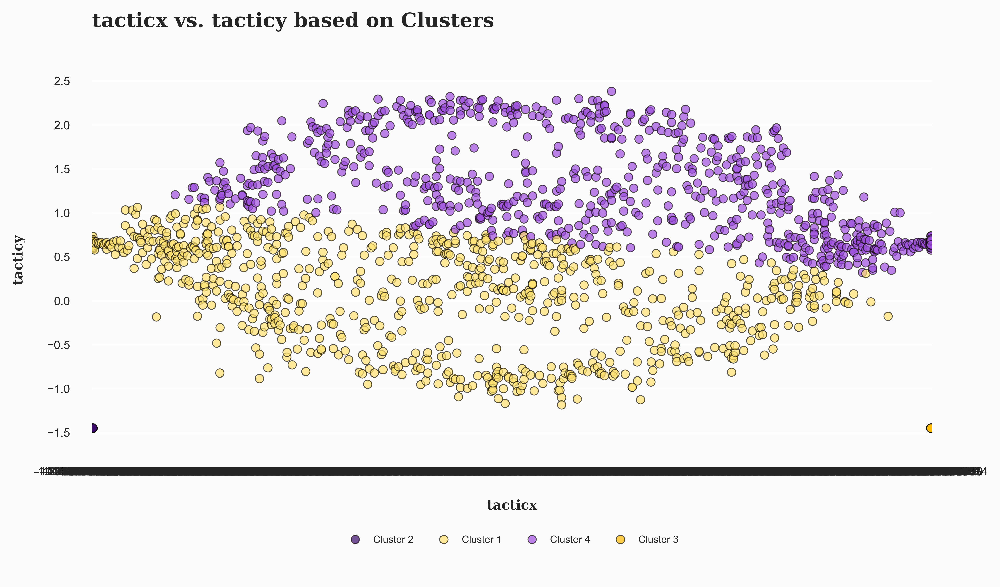

In [719]:

df_cv = combined_df[['tacticx', 'tacticy', 'cluster_result']]

# Define style parameters
color_palette = ['#3C096C', '#FFE270', '#9D4EDD', '#FFBB00']
stripplot_style = dict(edgecolor='#100C07', s=5, linewidth=0.5, alpha=0.7, palette=color_palette)
legend_style = dict(ncol=5, borderpad=3, frameon=False, fontsize=6, title=None)
xy_label = dict(fontweight='bold', fontsize=8, fontfamily='serif')
grid_style = dict(alpha=0.3, color='#9B9A9C', linestyle='dotted', zorder=1)
suptitle = dict(fontsize=12, ha='left', fontweight='heavy', fontfamily='serif')
title = dict(fontsize=8, loc='left', fontfamily='serif')

# Create the strip plot
plt.figure(figsize=(9, 4))
stplot = sns.stripplot(data=df_cv, x='tacticx', y='tacticy', hue='cluster_result', jitter=0.1, **stripplot_style)
sns.move_legend(stplot, 'upper center', bbox_to_anchor=(0.5, -0.15), **legend_style)
sns.despine(top=True, right=True, left=True, bottom=True)
plt.suptitle('tacticx vs. tacticy based on Clusters', x=0.125, y=1.01, **suptitle)
plt.xlabel('\ntacticx', **xy_label)
plt.ylabel('tacticy\n', **xy_label)
plt.xticks(fontsize=7)
plt.yticks(fontsize=7)

plt.gcf().set_size_inches(9, 4)
plt.show()



#Insights
From the above analysis, it is identified that Player Numorder from 1 to 11  and higher scores obtained through tacticy and a player being a captain are all clustered in cluster 4 (irrespective of the player country). Cluster3 entails information on players who are predominantly goal keepers, having a numorder from 12-23 and their scores being high on tacticx. However, we see the increased presence of countries like Austria, czech, Denmark, Germany, Italy, Poland, Russia, Scotland, North Macedonia and Switzerland in cluster 3. Rest of the countries are sparsely distributed in cluster1 and cluster 2.